  # ASETS-II cases simulation

  This is an example of a simulation package for conjugate heat transfer of an
  oscillating heat pipe. SI units are used and units are emitted

  ### What do we need to solve an OHP problem?

  **specify properties** : Solid property, Fluid property

  **set the geometries** : Computational domain, Heaters/Condensers, OHP shapes

  **construct the systems** : Fluid system(1D), HeatConduction system(2D)

  **initialize** : initialize the integrators and the data structs for saving

  **solve** : time marching to solve the two weakly coupled integrators
  alternately

  **save/examine** : save the data for post-processing

  # Packages

  Firstly, let's import the necessary packages, you may need to install them
  for the first time.

In [3]:
using OscillatingHeatPipe # our main package
using Plots # for plotting
using ProgressMeter # to have a progress bar in the calculation

  # Specify properties

  ### Solid Physical parameters

  params is the HeatConductionParameters for the plate material. The numbers
  below represents aluminum.

In [4]:
ρₛ = 2730; # material density [kg/m^3] Aluminum6061
cₛ  = 8.93e02; # material specific heat [J/kg K]
# kₛ  = 2.37e02; # material heat conductivity Aluminum6061
kₛ  = 1.93e02; # material heat conductivity Aluminum3003-O


αₛ = kₛ/ρₛ/cₛ

dₛ = 1.5e-3; # effective d (The thickness of an ideal uniform thickness plate occupying the same volume)

  ### Fluid Physical parameters

  pfluid contains the vapor and liquid properties at a constant reference
  temperature. Noted that the vapor pressure and the vapor density will be
  functions of temperatures during the simulation, other properties are
  extracted from pfluid as an approximate value.

In [5]:
Tref = 291.2# reference temperature (try higher!)
fluid_type = "Butane"
p_fluid = SaturationFluidProperty(fluid_type,Tref) # This function relies on CoolProp.jl package

Saturation properties for Butane at constant temperature 291.2 [K]


  # Set the geometries

  ### Geometry parameters

  The 2D domain is of rectangular shape (slightly different from ASETS-II). In
  the future it can be of arbitrary shape using the immersedlayers.jl package.

In [6]:
Δx = 0.000633 # [m]

Lx = 6*INCHES*1.02; # plate size x [m]
Ly = 2*INCHES*1.05; # plate size y [m]
xlim = (-Lx/2,Lx/2) # plate x limits
ylim = (-Ly/2,Ly/2) # plate y limits

g = PhysicalGrid(1.03 .* xlim,1.1 .* ylim,Δx); # build a gird slightly larger than the plate

## set physical parameters

In [7]:
power = 40 # Watt
areaheater_area = 50e-3 * 50e-3

0.0025000000000000005

In [8]:
phys_params = Dict( "diffusivity"              => αₛ,
                    "flux_correction"          => ρₛ*cₛ*dₛ,
                    # "angular velocity"         => 0.0,
                    "Fourier"                  => 1.0,
                    "ohp_flux"                 => [NaN], # initial value, the value here is useless
                    "areaheater_power"         => power, # total power
                    "areaheater_area"          => areaheater_area, # total area
                    "areaheater_temp"          => 0.0,   # relative temperature compared with "background temperature"
                    "areaheater_coeff"         => 4667.0,
                    "adiabatic_coeff"          => 0.0,
                    "background temperature"   => Tref
                     )
     

Dict{String, Any} with 10 entries:
  "areaheater_coeff"       => 4667.0
  "Fourier"                => 1.0
  "flux_correction"        => 3656.84
  "ohp_flux"               => [NaN]
  "diffusivity"            => 7.91668e-5
  "areaheater_area"        => 0.0025
  "areaheater_power"       => 40
  "areaheater_temp"        => 0.0
  "adiabatic_coeff"        => 0.0
  "background temperature" => 291.2

## Boundary conditions

In [9]:
Δs = 1.4*cellsize(g)

trim = 0.006
cond_block = 1.1INCHES
# xbound = [ -Lx/2,-Lx/2, -Lx/2+cond_block,-Lx/2+cond_block, Lx/2-cond_block,  Lx/2-cond_block, 
#             Lx/2, Lx/2,  Lx/2-cond_block, Lx/2-cond_block,-Lx/2+cond_block, -Lx/2+cond_block];
# ybound = [  Ly/2,-Ly/2, -Ly/2,           -Ly/2+trim,      -Ly/2+trim,       -Ly/2, 
#            -Ly/2, Ly/2,  Ly/2,            Ly/2-trim ,      Ly/2-trim,        Ly/2 ];
xbound = [ -Lx/2,-Lx/2, 
            Lx/2, Lx/2];
ybound = [  Ly/2,-Ly/2, 
           -Ly/2, Ly/2];
body = Polygon(xbound,ybound,Δs)

Closed polygon with 4 vertices and 470 points
   Current position: (0.0,0.0)
   Current angle (rad): 0.0


In [10]:
X = MotionTransform([0,0],0)
joint = Joint(X)
m = RigidBodyMotion(joint,body)
x = zero_motion_state(body,m)
update_body!(body,x,m)

Closed polygon with 4 vertices and 470 points
   Current position: (0.0,0.0)
   Current angle (rad): 0.0


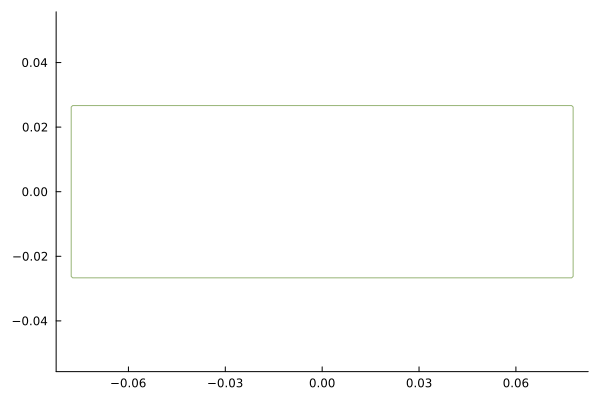

In [11]:
plot(body,fillalpha=0)

In [12]:
function get_qbplus(t,x,base_cache,phys_params,motions)
    nrm = normals(base_cache)
    qbplus = zeros_surface(base_cache)
    return qbplus
end

function get_qbminus(t,x,base_cache,phys_params,motions)
    nrm = normals(base_cache)
    qbminus = zeros_surface(base_cache)
    # qbminus .= nrm.u
    return qbminus
end

bcdict = Dict("exterior" => get_qbplus,"interior" => get_qbminus)

Dict{String, Function} with 2 entries:
  "interior" => get_qbminus
  "exterior" => get_qbplus

  ### Set up the evaporators and condensers

  Right now, the OHPtype looks up a preset dictionary of OHP evaporators and
  condensers.

  You can also customize them in the OHP DIY notebook

In [13]:
function heatermodel!(σ,T,t,fr::AreaRegionCache,phys_params)
    σ .= phys_params["areaheater_power"] / phys_params["areaheater_area"] / phys_params["flux_correction"] 
end


function condensermodel!(σ,T,t,fr::AreaRegionCache,phys_params)
    T0 = phys_params["areaheater_temp"]
    h = phys_params["areaheater_coeff"]
    corr = phys_params["flux_correction"] 

    σ .= h*(T0 - T) / corr
end

function adiabaticmodel!(σ,T,t,fr::AreaRegionCache,phys_params)
    T0 = phys_params["areaheater_temp"]
    h = phys_params["adiabatic_coeff"]
    corr = phys_params["flux_correction"] 

    σ .= h*(T0 - T)/ corr
end

adiabaticmodel! (generic function with 1 method)

In [14]:
# fregion1_h = Rectangle(6e-3,6e-3,1.4*Δx)
fregion1_h = Rectangle(25e-3,25e-3,1.4*Δx)
# fregion1_h = Rectangle(6e-3,6e-3,1.4*Δx)
# fregion2_h = deepcopy(fregion1_h)
tr1_h = RigidTransform((0.0,-0.0),0.0)
# tr2_h = RigidTransform((-25e-3,-0.0),0.0)

heater1 = AreaForcingModel(fregion1_h,tr1_h,heatermodel!);
# heater2 = AreaForcingModel(fregion2_h,tr2_h,heatermodel!);

In [15]:
# fregion1_c = Rectangle(7.5e-3,1.0INCHES,1.4*Δx)
# tr1_c = RigidTransform((2.7INCHES,-0.0),0.0)
# # fregion1_c = Rectangle(15e-3,1.0INCHES,1.4*Δx)
# # tr1_c = RigidTransform((2.4INCHES,-0.0),0.0)
# # fregion2_c = deepcopy(fregion1_c)
# fregion2_c = Rectangle(67e-3,1.0INCHES,1.4*Δx)
# tr2_c = RigidTransform((-0.35INCHES,-0.0),0.0)

# cond1 = AreaForcingModel(fregion1_c,tr1_c,condensermodel!);
# cond2 = AreaForcingModel(fregion2_c,tr2_c,adiabaticmodel!);

In [16]:
fregion1_c = Rectangle(7.5e-3,1.0INCHES,1.4*Δx)
tr1_c = RigidTransform((2.7INCHES,-0.0),0.0)
# fregion1_c = Rectangle(0.5INCHES,1.0INCHES,1.4*Δx)
# tr1_c = RigidTransform((2.5INCHES,-0.0),0.0)


fregion2_c = deepcopy(fregion1_c)
tr2_c = RigidTransform((-2.7INCHES,-0.0),0.0)
# tr2_c = RigidTransform((-2.5INCHES,-0.0),0.0)

# fregion3_c = deepcopy(fregion1_h)
# tr3_c = RigidTransform((-0INCHES,-0.0),0.0)

cond1 = AreaForcingModel(fregion1_c,tr1_c,condensermodel!);
cond2 = AreaForcingModel(fregion1_c,tr2_c,condensermodel!);
# cond3 = AreaForcingModel(fregion3_c,tr3_c,adiabaticmodel!);

  ### Set up OHP channel's shape

  constructohpcurve is a built-in function that generates two arrays: x that
  contains all x values of the discrete points, and y contains all y values. x
  and y have the same length.

  You can also customize this function to generate an OHP shape of your choice
  as long as they produce x array and y array.

In [17]:
# x, y = construct_ohp_curve("ASETS",Δx) # get x and y coordinates for the channel
    ds = 1.5Δx
    nturn = 16
    width_ohp = 46.25*1e-3
    length_ohp = 133.83*1e-3
    gap = 1e-3
    pitch = width_ohp/(2*nturn+1)

    x0, y0 = length_ohp/2 + 1e-3, width_ohp/2
    x, y, xf, yf = construct_ohp_curve(nturn,pitch,length_ohp,gap,ds,x0,y0,false,false,3pi/2)


    # x0, y0 = -length_ohp/2 -2e-3, -width_ohp/2
    # x, y, xf, yf = construct_ohp_curve(nturn,pitch,length_ohp,gap,ds,x0,y0,false,false,pi/2)
    
ohp = BasicBody(x,y) # build a BasicBody based on x,y

# fregion1 = Square(0.5,1.4*Δx)
tr_ohp = RigidTransform((0.0,0.0),0.0)

# phys_params["ohp_flux"] = zero(x);

function ohpmodel!(σ,T,t,fr::LineRegionCache,phys_params)
    σ .= phys_params["ohp_flux"] ./ phys_params["flux_correction"] 
end
ohp_linesource = LineForcingModel(ohp,tr_ohp,ohpmodel!);

  ### Plot what you got so far

  This is a exmaple of the compuational domain (the box) and the OHP channel
  serpentine (in blue)

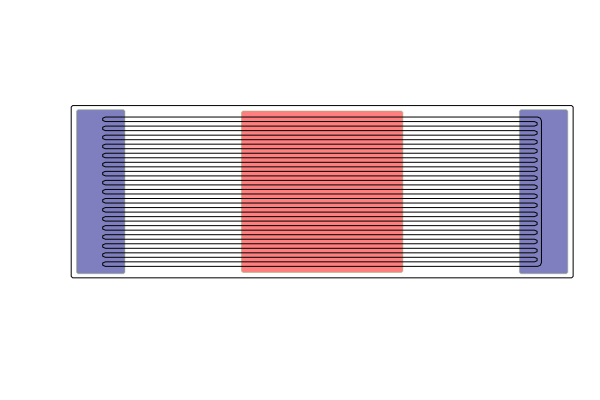

In [18]:
plot(body,fillalpha=0,linecolor=:black,framestyle=:plain)
update_body!(fregion1_h,tr1_h)
# update_body!(fregion2_h,tr2_h)
update_body!(fregion1_c,tr1_c)
update_body!(fregion2_c,tr2_c)
# update_body!(fregion3_c,tr3_c)
# update_body!(fregion3,tr3)
# update_body!(fregion4,tr4)
plot!(fregion1_h,fillcolor=:red,alpha=0.5)
plot!(fregion1_c,fillcolor=:navyblue,alpha=0.5)
# plot!(fregion2_h)
plot!(fregion2_c,fillcolor=:navyblue,alpha=0.5)
# plot!(fregion3_c,fillcolor=:navyblue,alpha=0.5)
# plot!(fregion2)
# plot!(fregion3)
# plot!(fregion4)
plot!(ohp,fillalpha=0,closedornot=true,linecolor=:black,showaxis = false)
# annotate!(x2Dsensors[RTD_for_plotting], y2Dsensors[RTD_for_plotting].-0.005, RTD_for_plotting)
# savefig("layout_H04.pdf")

In [19]:
# RTD_for_plotting = [3,11]
# x2Dsensors = [0.0,   0.0, 0.0, 0.0, 0.0,-3INCHES+12e-3,-3INCHES+35e-3,-3INCHES+50e-3,3INCHES-50e-3,3INCHES-35e-3,3INCHES-12e-3]
# y2Dsensors = [-2e-2, -1e-2, 0.0, 1e-2, 2e-2,0.0,           0.0,            0.0,          0.0,          0.0,          0.0]
# plate_sensors = (x2Dsensors,y2Dsensors);
# scatter!(x2Dsensors[RTD_for_plotting],y2Dsensors[RTD_for_plotting],color=:black)
# annotate!(x2Dsensors[RTD_for_plotting], y2Dsensors[RTD_for_plotting].-0.005, RTD_for_plotting)

# # savefig("layout_H04.pdf")

In [20]:
# forcing_dict = Dict("heating models" => [heater1,cond1,ohp_linesource])
forcing_dict = Dict("heating models" => [heater1,cond1,cond2,ohp_linesource])

Dict{String, Vector{AbstractForcingModel}} with 1 entry:
  "heating models" => [AreaForcingModel{Polygon{224, 4, ClosedBody}, MotionTran…

In [21]:
tspan = (0.0, 100.0); # start time and end time
dt_record = 1.0   # saving time interval

tstep = 4e-4     # actrual time marching step

0.0004

In [22]:
timestep_fixed(u,sys) = tstep

timestep_fixed (generic function with 1 method)

In [23]:
prob = NeumannHeatConductionProblem(g,body,scaling=GridScaling,
                                             phys_params=phys_params,
                                             bc=bcdict,
                                             motions=m,
                                             forcing=forcing_dict,
                                             # timestep_func=timestep_fourier
                                             timestep_func=timestep_fixed
    );

  # Construct the systems

  ### Create HeatConduction system

  The solid module dealing with the 2D conduction, evaporator, condenser, and
  the OHP line heat source is constructed here.

In [24]:
sys_plate = construct_system(prob);

  ### Create OHP inner channel system

  sys_tube: fluid module system

In [25]:
sys_tube = initialize_ohpsys(sys_plate,p_fluid,power,g = [-9.8,0.0])
# sys_tube = initialize_ohpsys(sys_plate,p_fluid,power)

4878 point OHP system filled with Butane


  # Initialize

  ### set time step

  ### combine inner tube and plate together

In [26]:
tspan_init = (0.0,1e4) # for plate, should be a range larger than the TOTAL time you plan to simulate (including saving and re-run),
# if the range is smaller than the total time range, there will be errors in temperature interpolations

u_plate = init_sol(sys_plate)# initialize plate T field to uniform Tref
integrator_plate = init(u_plate,tspan_init,sys_plate,save_on=false) # construct integrator_plate

u_tube = newstate(sys_tube) # initialize OHP tube
integrator_tube = init(u_tube,tspan,sys_tube); # construct integrator_tube

### initialize arrays for saving

In [27]:
SimuResult = SimulationResult(integrator_tube,integrator_plate);

  # Solve

  ### Run the simulation and store data

In [28]:
# integrator_plate.p.phys_params["areaheater_coeff"] = 2760

In [35]:
@showprogress for t in tspan[1]:tstep:tspan[1]

  @time timemarching!(integrator_tube,integrator_plate,tstep)

    if (mod(integrator_plate.t,dt_record) < 1e-6) || (mod(-integrator_plate.t,dt_record) < 1e-6)
        store!(SimuResult,integrator_tube,integrator_plate)
    end

end

  0.029080 seconds (62.05 k allocations: 33.269 MiB)


In [109]:
integrator_tube

t: 0.0004
u: 2511-element Vector{Float64}:
   2.661847547433893
   2.706444672653205
   2.8173311058226043
   2.8510812642733674
   2.9728127587700857
   3.0539496405206883
   3.128293336139436
   3.219935423563265
   3.2837768995426666
   3.342199205391305
   3.4392573590359135
   3.540286255384815
   3.59474075988491
   ⋮
 291.2
 291.2
 291.2
 291.2
 291.2
 291.2
 291.2
 291.2
 291.2
 291.2
 291.2
 291.2006645784694

  # Store data

In [36]:
using JLD2

In [56]:
# read_path =  "../numedata/Zach_1s_H01.jld2";
# SimuResult = load(read_path)["SimulationResult"];

In [37]:
save_path = "../numedata/aha.jld2"
save(save_path,"SimulationResult",SimuResult)

### take a peek at the solution (more at the PostProcessing notebook)

In [30]:
@gif for i in eachindex(SimuResult.tube_hist_t)
    # plot(OHPSlug(),i,SimuResult,aspectratio=1)
    plot(OHPTemp(),i,SimuResult,clim=(291.2,305.0))
    # plot(SimuResult.plate_T_hist[i],colorbar=true,fill=true)
    plot!(body,fillalpha=0)
end

LoadError: ArgumentError: Cannot build empty animations

In [31]:
plot(SimuResult.plate_T_hist[end])

LoadError: BoundsError: attempt to access 0-element Vector{Any} at index [0]

[ Info: Saved animation to /Users/yuxuanli/Documents/GitHub/OscillatingHeatPipe/examples/tmp.gif


Plots.AnimatedGif("/Users/yuxuanli/Documents/GitHub/OscillatingHeatPipe/examples/tmp.gif")
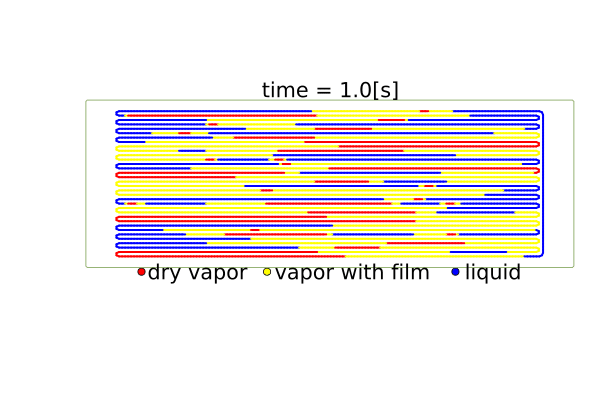

In [488]:
@gif for i in eachindex(SimuResult.tube_hist_t)
    plot(OHPSlug(),i,SimuResult,aspectratio=1)
    # plot(OHPTemp(),i,SimuResult,clim=(0.0,10.0))
    # plot(SimuResult.plate_T_hist[i],colorbar=true,fill=true)
    plot!(body,fillalpha=0)
end

In [489]:
x2Dsensors = [0.0,   0.0, 0.0, 0.0, 0.0,-3INCHES+12e-3,-3INCHES+35e-3,-3INCHES+65e-3,3INCHES-65e-3,3INCHES-35e-3,3INCHES-12e-3]
y2Dsensors = [-2e-2, -1e-2, 0.0, 1e-2, 2e-2,0.0,           0.0,            0.0,          0.0,          0.0,          0.0]
plate_sensors = (x2Dsensors,y2Dsensors);

In [490]:
t_hist,g_hist = getTcurve(plate_sensors,SimuResult);

In [491]:
RTD_for_plotting = [6,3,11];

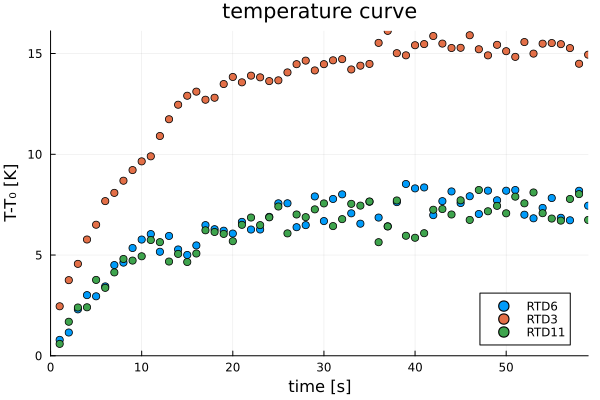

In [492]:
scatter(OHPTcurve(), RTD_for_plotting, (t_hist,g_hist), SimuResult)

In [482]:
ihot = 3 # hot sensor  for calculating thermal conductance
icold = 11 # cold sensor  for calculating thermal conductance;

11

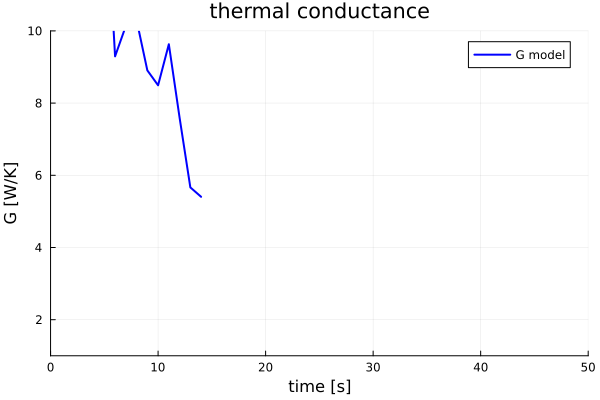

In [483]:
plot(OHPCond(),(ihot,icold),(t_hist,g_hist),SimuResult,xlim=(0,50),ylim=(1,10))

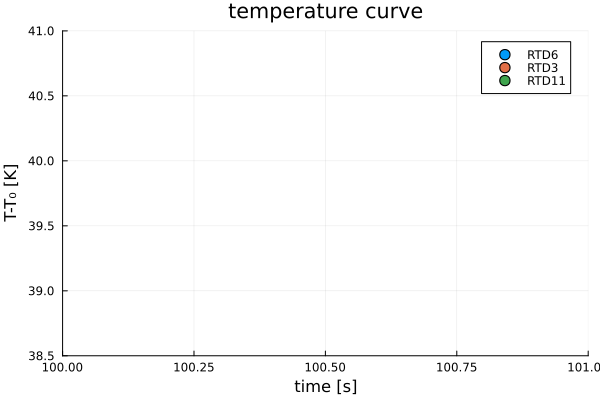

In [469]:
scatter(OHPTcurve(),RTD_for_plotting,(t_hist,g_hist),SimuResult,xlim=(100.0,101.0),ylim=(38.5,41))

In [57]:
import XLSX
expfile = expfileDict["O001_H001_P040"]
exppath = "../expdata/"
xf = XLSX.readxlsx(exppath*expfile);

In [58]:
Onum, Hnum, power_exp = getconfig(expfile)
RTDt,RTD = getRTD(xf,Onum);

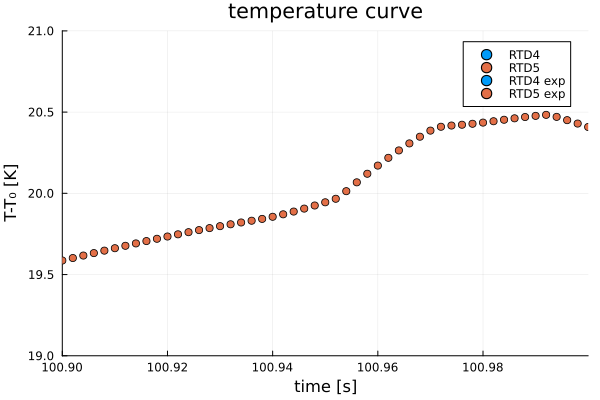

In [70]:
scatter(OHPTcurve(),RTD_for_plotting,(t_hist,g_hist),SimuResult)
plot!(OHPTexp() ,RTD_for_plotting,(RTDt,RTD)     ,SimuResult,xlim=(100.9,101.0),ylim=(19,21))

---

*This notebook was generated using [Literate.jl](https://github.com/fredrikekre/Literate.jl).*

# Plot pressure propogation

In [25]:
using JLD2
read_path = "../numedata/Zach_100s_90D_detail.jld2"
SimuResult = load(read_path,"SimulationResult");

In [26]:
# center
L = SimuResult.integrator_tube.p.tube.L
line_gap=0.149
line_offset=0.074

0.074

In [44]:
# left end
L = SimuResult.integrator_tube.p.tube.L
line_gap=0.149*2
line_offset=0.149

0.149

In [53]:
# right end
L = SimuResult.integrator_tube.p.tube.L
line_gap=0.149*2
line_offset=0.149*2

0.298

In [27]:
# all
L = SimuResult.integrator_tube.p.tube.L
line_gap=0.149/2
line_offset=0.074

0.074

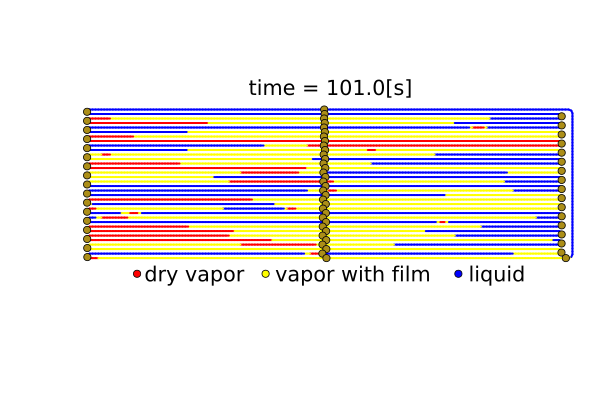

In [28]:
L = SimuResult.integrator_tube.p.tube.L
# @manipulate for ξ in 0:1e-3:L
ξ = line_offset:line_gap:L
    plot(OHPSlug(),1500,SimuResult,aspectratio=1) # plot the ohp layout

    xprobe,yprobe = oneDtwoDtransform(ξ,SimuResult)
    scatter!([xprobe],[yprobe])
# end
# savefig("sensors.png")

In [29]:
sys_hist = getcurrentsys.(SimuResult.tube_hist_u,[SimuResult.integrator_tube_resume.p]);

In [30]:
t = SimuResult.tube_hist_t;

In [31]:
using Interact

WebIO._IJuliaInit()

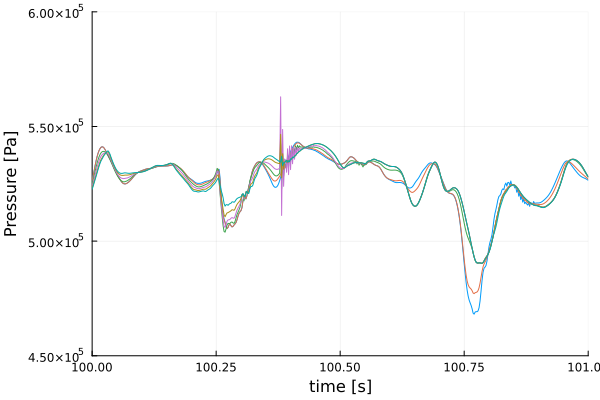

In [33]:
plotting_label=[1,2,4,5,6,7]
# plotting_label=[30,31,33,34,1]
# plotting_label=[20,21,22,23,25]
# plotting_label=[10,11,13,14,15,16]
# plotting_label=[10,30]
# plotting_label=1:34
xsensors1D = ξ

θhist1D,phist1D = get1DTandP(xsensors1D, SimuResult);

plot(t,phist1D[:,plotting_label],label=string.("channel ", plotting_label'),xlabel="time [s]", legend=false,ylabel="Pressure [Pa]",xlim=(100.0,101.0),ylim=(4.5e5,6e5))
# end

[ Info: Saved animation to /Users/yuxuanli/Documents/GitHub/OscillatingHeatPipe/examples/tmp.gif


Plots.AnimatedGif("/Users/yuxuanli/Documents/GitHub/OscillatingHeatPipe/examples/tmp.gif")
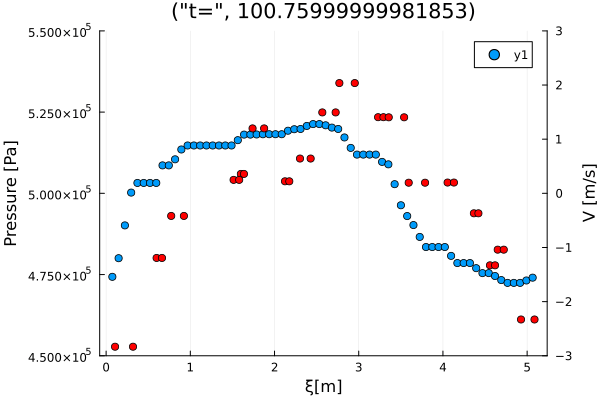

In [34]:
θhist1D,phist1D = get1DTandP(xsensors1D, SimuResult);

rad_range = (1:length(xsensors1D)) ./ length(xsensors1D) *2π

@gif for i in [1380]

X1 = first.(sys_hist[i].liquid.Xp)
X2 = last.(sys_hist[i].liquid.Xp)
V1 = first.(sys_hist[i].liquid.dXdt)
V2 = last.(sys_hist[i].liquid.dXdt);
    
scatter(xsensors1D,phist1D[i,:],title = ("t=", t[i]),xlabel="ξ[m]", ylabel="Pressure [Pa]",ylim=(4.5e5,5.5e5))
scatter!(twinx(),hcat(X1,X2)',hcat(V1,V2)',legend=false,markercolor=:red,ylim=(-3,3),ylabel="V [m/s]")
end

[ Info: Saved animation to /Users/yuxuanli/Documents/GitHub/OscillatingHeatPipe/examples/tmp.gif


Plots.AnimatedGif("/Users/yuxuanli/Documents/GitHub/OscillatingHeatPipe/examples/tmp.gif")
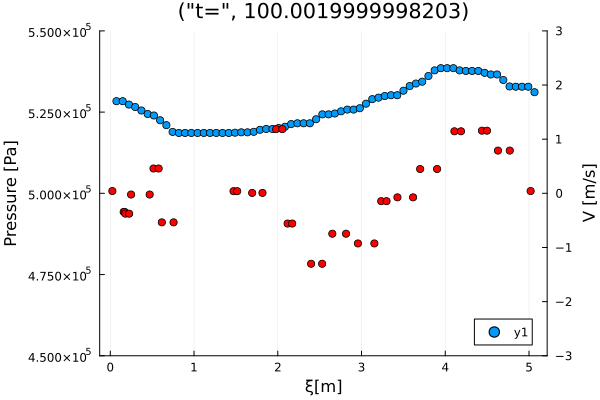

In [88]:
θhist1D,phist1D = get1DTandP(xsensors1D, SimuResult);

rad_range = (1:length(xsensors1D)) ./ length(xsensors1D) *2π

@gif for i in 1001:1500

X1 = first.(sys_hist[i].liquid.Xp)
X2 = last.(sys_hist[i].liquid.Xp)
V1 = first.(sys_hist[i].liquid.dXdt)
V2 = last.(sys_hist[i].liquid.dXdt);
    
scatter(xsensors1D,phist1D[i,:],title = ("t=", t[i]),xlabel="ξ[m]", ylabel="Pressure [Pa]",ylim=(4.5e5,5.5e5))
scatter!(twinx(),hcat(X1,X2)',hcat(V1,V2)',legend=false,markercolor=:red,ylim=(-3,3),ylabel="V [m/s]")
end

[ Info: Saved animation to /Users/yuxuanli/Documents/GitHub/OscillatingHeatPipe/examples/tmp.gif


Plots.AnimatedGif("/Users/yuxuanli/Documents/GitHub/OscillatingHeatPipe/examples/tmp.gif")
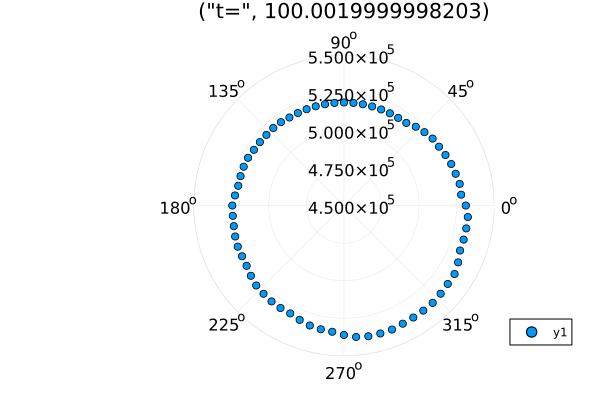

In [90]:
θhist1D,phist1D = get1DTandP(xsensors1D, SimuResult);

rad_range = (1:length(xsensors1D)) ./ length(xsensors1D) *2π

@gif for i in 1001:1500
scatter(rad_range,phist1D[i,:],proj = :polar,title = ("t=", t[i]),xlabel="time [s]", ylabel="Pressure [Pa]",xlim=(1,34),ylim=(4.5e5,5.5e5))
# scatter!(twinx(),hcat(X1,X2)',hcat(V1,V2)',legend=false,markercolor=:red,ylim=(-3,3),ylabel="V [m/s]")
end

In [147]:
? getcurrentsys

search: getcurrentsys getcurrentsys!



No documentation found.

`OscillatingHeatPipe.getcurrentsys` is a `Function`.

```
# 1 method for generic function "getcurrentsys" from OscillatingHeatPipe:
 [1] getcurrentsys(u, sys0)
     @ ~/Documents/GitHub/OscillatingHeatPipe/src/utils/Postprocessing.jl:68
```


In [160]:
t[1190]

100.37999999981942

In [35]:
sys_hist[1190].liquid.Xp[1]

(1.6470179045322788, 1.6931882821115636)

In [36]:
V1

LoadError: UndefVarError: `V1` not defined

In [37]:
X1 = first.(sys_hist[1190].liquid.Xp)
X2 = last.(sys_hist[1190].liquid.Xp)
V1 = first.(sys_hist[1190].liquid.dXdt)
V2 = last.(sys_hist[1190].liquid.dXdt);

In [73]:
Vmax_p = zeros(size(sys_hist))
Vmax_m = zeros(size(sys_hist))
ΔPmax = zeros(size(sys_hist))
for i in eachindex(sys_hist)
    V1max = first.(sys_hist[i].liquid.dXdt)
    V2max = last.(sys_hist[i].liquid.dXdt)
    P = sys_hist[i].vapor.P
# println(maximum(abs.([V1max;V2max])))
    Vmax_p[i] = maximum(([V1max;V2max]))
    Vmax_m[i] = minimum(([V1max;V2max]))
    ΔPmax[i]   = maximum(P) - minimum(P)
end

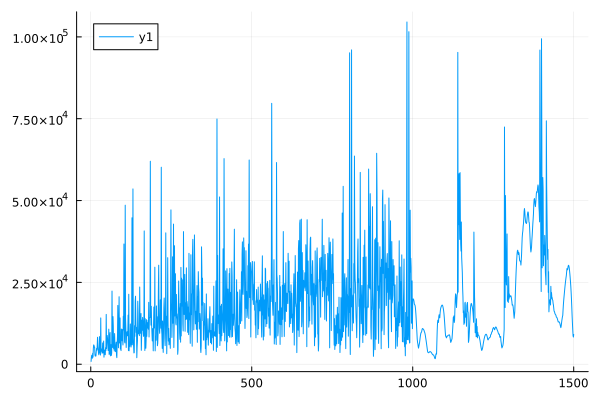

In [75]:
plot(ΔPmax)

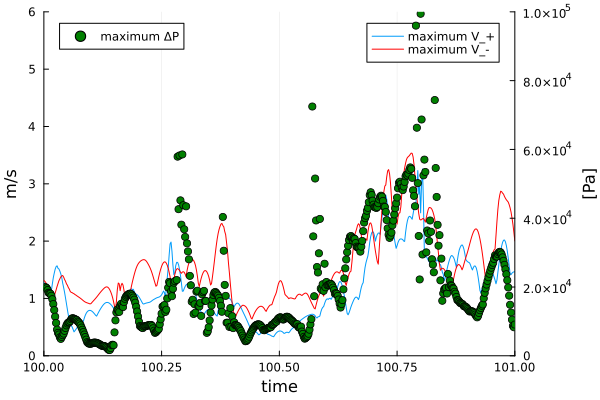

In [106]:
plot(t,Vmax_p,xlim=(100.0,101.0),ylim=(0,6),xlabel="time[s]",label="maximum V_+")
plot!(t,-Vmax_m,xlim=(100.0,101.0),ylim=(0,6),linecolor=:red,xlabel="time",label="maximum V_-",ylabel="m/s")
scatter!(twinx(),t,ΔPmax,xlim=(100.0,101.0),markercolor=:green,ylim=(0,1e5),label="maximum ΔP",ylabel="[Pa]")

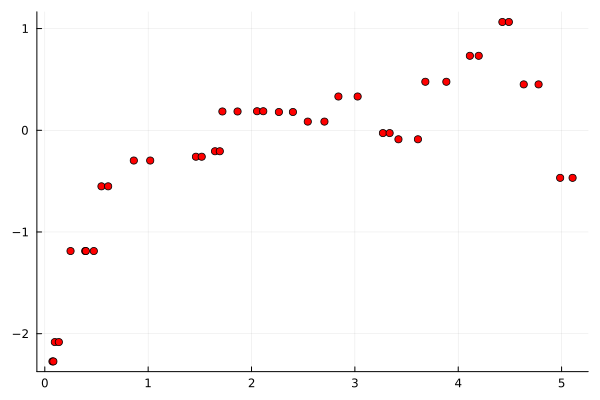

In [74]:
scatter(hcat(X1,X2)',hcat(V1,V2)',legend=false,markercolor=:red)

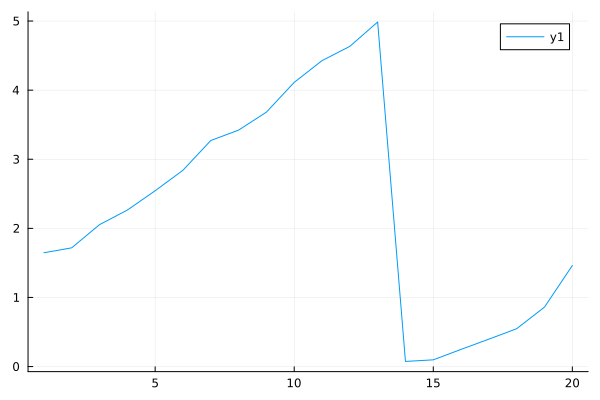

In [56]:
plot(I1)

In [52]:
vcat(sys_hist[1190].liquid.Xp...)

20-element Vector{Tuple{Float64, Float64}}:
 (1.6470179045322788, 1.6931882821115636)
 (1.7183355003358793, 1.8648549580520664)
 (2.0537164528060488, 2.1136060171904925)
 (2.2648513124102747, 2.400664223275778)
 (2.5443458089844824, 2.705625313045982)
 (2.840774324026413, 3.0268036833025387)
 (3.271519151955026, 3.336206110022231)
 (3.4216423709562824, 3.610125760000982)
 (3.681907953071041, 3.8851521894745646)
 (4.11266410066129, 4.198276391662943)
 (4.427279920560455, 4.489627791020777)
 (4.633797171110778, 4.7773874806870325)
 (4.9861114235260295, 5.106430854589974)
 (0.07427009214675283, 0.0828886046978598)
 (0.09722318951369716, 0.13572372980029682)
 (0.24902629153243117, 0.3911318396144108)
 (0.3971318396144108, 0.47415514700466527)
 (0.548260730118059, 0.6130424051498197)
 (0.8612401823587631, 1.0198929712592566)
 (1.4623341483543346, 1.518238788508127)

In [47]:
sys_hist[1190].liquid.Xp[1][1:2]

(1.6470179045322788, 1.6931882821115636)

In [46]:
plot(sys_hist[1190].liquid.Xp[1][1:2],sys_hist[1190].liquid.dXdt[1][1:2])

LoadError: Cannot convert Float64 to series data for plotting

In [37]:
sys_hist[1190].liquid.dXdt

20-element Vector{Tuple{Float64, Float64}}:
 (-0.20621250806624453, -0.20621250806624453)
 (0.1849202705954444, 0.1849202705954444)
 (0.18727408133844495, 0.18727408133844495)
 (0.1796041188993377, 0.1796041188993377)
 (0.08519164681134789, 0.08519164681134789)
 (0.33199817419328775, 0.33199817419328775)
 (-0.027661393913564217, -0.027661393913564217)
 (-0.08856913223342874, -0.08856913223342874)
 (0.4768858510226712, 0.4768858510226712)
 (0.7321529424756433, 0.7321529424756433)
 (1.0646297294422042, 1.0646297294422042)
 (0.4511357056589182, 0.4511357056589182)
 (-0.4677486251888691, -0.4677486251888691)
 (-2.272762837343241, -2.272762837343241)
 (-2.0824893006689207, -2.0824893006689207)
 (-1.187396876856398, -1.187396876856398)
 (-1.187396876856398, -1.187396876856398)
 (-0.5510790303692111, -0.5510790303692111)
 (-0.2975172228296734, -0.2975172228296734)
 (-0.26006960536697105, -0.26006960536697105)

In [38]:
sys_hist[1190].liquid.Xp

20-element Vector{Tuple{Float64, Float64}}:
 (1.6470179045322788, 1.6931882821115636)
 (1.7183355003358793, 1.8648549580520664)
 (2.0537164528060488, 2.1136060171904925)
 (2.2648513124102747, 2.400664223275778)
 (2.5443458089844824, 2.705625313045982)
 (2.840774324026413, 3.0268036833025387)
 (3.271519151955026, 3.336206110022231)
 (3.4216423709562824, 3.610125760000982)
 (3.681907953071041, 3.8851521894745646)
 (4.11266410066129, 4.198276391662943)
 (4.427279920560455, 4.489627791020777)
 (4.633797171110778, 4.7773874806870325)
 (4.9861114235260295, 5.106430854589974)
 (0.07427009214675283, 0.0828886046978598)
 (0.09722318951369716, 0.13572372980029682)
 (0.24902629153243117, 0.3911318396144108)
 (0.3971318396144108, 0.47415514700466527)
 (0.548260730118059, 0.6130424051498197)
 (0.8612401823587631, 1.0198929712592566)
 (1.4623341483543346, 1.518238788508127)

In [190]:
Lvapor = XptoLvaporplug(sys_hist[1196].liquid.Xp,sys_hist[1190].tube.L,sys_hist[1190].tube.closedornot);

In [191]:
Lvapor[17]

0.0073820909085435815

In [73]:
SimuResult.boil_hist

441-element Vector{Any}:
 [25.0, 1.6799999999998803]
 [99.0, 1.719997605816596]
 [35.0, 1.909999999999855]
 [226.0, 1.909999999999855]
 [31.0, 1.9399999999998516]
 [233.0, 2.089999999999835]
 [204.0, 2.119999999999832]
 [209.0, 2.119999999999832]
 [205.0, 2.1399999999998296]
 [25.0, 2.709999999999767]
 [20.0, 2.9599999999997393]
 [103.0, 3.1399999999997195]
 [208.0, 3.4499999999996853]
 ⋮
 [195.0, 99.27999999982198]
 [4.0, 99.37999999982175]
 [3.0, 99.3999999998217]
 [155.0, 99.6599999998211]
 [19.0, 99.70999999982098]
 [81.0, 100.27999999981965]
 [20.0, 100.37999999981942]
 [228.0, 100.56999999981898]
 [184.0, 100.78999999981846]
 [165.0, 100.79999999981844]
 [183.0, 100.79999999981844]
 [167.0, 100.82999999981837]

In [82]:
gravity = [-9.8,0.0]
x = [-75e-3,0,75e-3]
y = [-15e-3,0,15e-3]
getgh(gravity,x,y)
sys_tube.mapping.heightg_interp[0.15]

-0.7321079897571595

LoadError: ArgumentError: Package CPUID not found in current path.
- Run `import Pkg; Pkg.add("CPUID")` to install the CPUID package.